In [ ]:
!pip install chart_studio
import chart_studio.plotly as py
from plotly.offline import iplot
import plotly.graph_objs as go
from IPython.display import HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.font_manager as font_manager
import datetime
from scipy.optimize import minimize
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from google.colab import drive
drive.mount('/content/drive')

     |████████████████████████████████| 71kB 1.4MB/s 
Mounted at /content/drive


# Lower reservoir 

In [ ]:
# rain_day_lower: rainfall of lower catchment
# qtot_lower: total runoff of lower catchent
# etot_lower: evapotransporation of lower catchment (for AWBM)
# msl_reservoir_lower: evaporation of lower reservoir
# rain_day_reservoir_lower: rainfall of lower reservoir

rain_day = pd.read_csv('/content/drive/My Drive/CIVL4516/rain_day_lower.csv') # catchment data
qtot = pd.read_csv('/content/drive/My Drive/CIVL4516/qtot_lower.csv') # catchment data
etot = pd.read_csv('/content/drive/My Drive/CIVL4516/etot_lower.csv') # catchment data

msl = pd.read_csv('/content/drive/My Drive/CIVL4516/msl_reservoir_lower.csv') # reservoir data
rainfall_res = pd.read_csv('/content/drive/My Drive/CIVL4516/rain_day_reservoir_lower.csv') # reservoir data

def process_date(df,*args):
  df['time'] = [i-693959 for i in df['time']]
  df['time']=pd.to_datetime(
      df['time'],
      unit = 'd',
      origin='1899-12-30'
      )
  return df

rainfall = process_date(rain_day).set_index('time')
q_total = process_date(qtot).set_index('time')
e_total = process_date(etot).set_index('time')
msl = process_date(msl).set_index('time')
rainfall_res = process_date(rainfall_res).set_index('time')
# check missing data
#temp = q_total.loc[(q_total.index<='1990-12-31')|(q_total.index>='1994-01-01')]

def data_processing(a,b,c,d,e):
  com = pd.Series(sorted(list(set(a.index) & set(b.index) & set(c.index)& set(d.index)& set(e.index))))
  a = a.loc[(a.index.isin(com))]
  b = b.loc[(b.index.isin(com))]
  c = c.loc[(c.index.isin(com))]
  d = d.loc[(d.index.isin(com))]
  e = e.loc[(e.index.isin(com))]
  return a,b,c,d,e

rainfall, q_total, e_total, msl, rainfall_res = data_processing(rainfall, q_total, e_total, msl, rainfall_res)

print(rainfall.isnull().any())
print(q_total.isnull().any())
print(e_total.isnull().any())
print(msl.isnull().any())
print(rainfall_res.isnull().any())

rainfall    False
dtype: bool
qtot    False
dtype: bool
etot    False
dtype: bool
msl    False
dtype: bool
rain    False
dtype: bool


In [ ]:
rainfall

,rainfall
time,
1975-01-01,8.900001
1975-01-02,14.633334
1975-01-03,24.600000
1975-01-04,29.900000
1975-01-05,8.033333
...,...
2019-12-27,9.031250
2019-12-28,45.166667
2019-12-29,88.265625


In [ ]:
#========== model parameters ================
A = float(65.19);       # Catchment area [k^2]
A1 = float(0.134)       # [0-1]
A2 = float(0.433)       # [0-1]
A3 = 1- A1 - A2       # [0-1]
C1 = float(7)         # [mm]
C2 = float(70)       # [mm]
C3 = float(150)       # [mm]  
BFI = float(0.13)      # Base flow index [0-1] 0.35
Kbase = float(0.813)   # Baseflow recession constant [0-1] 0.95
Ksurf = float(0.35)    # Surface flow recession constant [0-1]

# Setting initial storage capacities
S1_0 = float(0)        # Initial storage capacity storage 1 [mm]
S2_0 = float(0)      # Initial storage capacity storage 2 [mm]
S3_0 = float(0)     # Initial storage capacity storage 3 [mm]
BS_0 = float(0)     # Initial storage capacity baseflow store [mm]
SS_0 = float(0)     # Initial storage capacity surface flow store [mm]

# Parameters needed to be calibrate
parameters = [A1,A2,A3,C1,
             C2,C3,BFI,Kbase,Ksurf,
             S1_0,S2_0,S3_0,BS_0,SS_0]


# Reading data
Date = rainfall[:].index
E = e_total[:].values
P = rainfall[:].values
observed = q_total[:].values
observed = [i for k in observed for i in k]
pd.set_option('precision', 9) 

In [ ]:
%%time
def AWBM(parameters, P, E):
    dims = np.shape(P)
    dS = []
    S1 = []; S2 = []; S3 = []
    S1_Excess =[]; S2_Excess =[]; S3_Excess =[]
    Total_Excess = []
    BaseFlowRecharge = []
    SurfaceFlowRecharge = []
    BS = []
    SS = []
    Qbase = []
    Qsurf = []
    Qtotal = []
    Q = []
    dS  = P[0]-E[0] # change in storage

    S1_temp = max(parameters[9]+dS,0)
    S1_Excess = max(S1_temp-parameters[3],0)
    S1.append(min(S1_temp,parameters[3]))

    S2_temp = max(parameters[10]+dS,0)
    S2_Excess = max(S2_temp-parameters[4],0)
    S2.append(min(S2_temp,parameters[4]))

    S3_temp = max(parameters[11]+dS,0)
    S3_Excess = max(S3_temp-parameters[5],0)
    S3.append(min(S3_temp,parameters[5]))

    Total_Excess.append((S1_Excess*parameters[0])+(S2_Excess*parameters[1])+(S3_Excess*parameters[2]))

    BaseFlowRecharge = Total_Excess[0] * parameters[6]
    SurfaceFlowRecharge = Total_Excess[0] * (1-parameters[6])

    #BS_temp = (BaseFlowRecharge/2)+BS_0
    BS_temp = BaseFlowRecharge + parameters[12]
    Qbase.append((1-parameters[7])*BS_temp)
    BS.append(max((parameters[12] + BaseFlowRecharge - Qbase[0]),0))

    #SS_temp = (SurfaceFlowRecharge/2)+SS_0
    SS_temp = SurfaceFlowRecharge + parameters[13]
    Qsurf.append((1-parameters[8])*SS_temp)
    SS.append(max((parameters[13] + SurfaceFlowRecharge - Qsurf[0]),0))

    Qtotal.append(Qbase[0] + Qsurf[0])
    Q.append(((Qtotal[0]/1000)*(A*1000*1000))/24/60/60)

    for i in range(1,dims[0]):
        dS = P[i]-E[i] 

        S1_temp = max(S1[i-1]+dS,0)
        S1_Excess = max(S1_temp-parameters[3],0)
        S1.append(min(S1_temp,parameters[3]))

        S2_temp = max(S2[i-1]+dS,0)
        S2_Excess = max(S2_temp-parameters[4],0)
        S2.append(min(S2_temp,parameters[4]))

        S3_temp = max(S3[i-1]+dS,0)
        S3_Excess = max(S3_temp-parameters[5],0)
        S3.append(min(S3_temp,parameters[5]))

        Total_Excess.append((S1_Excess*parameters[0])+(S2_Excess*parameters[1])+(S3_Excess*parameters[2]))

        BaseFlowRecharge = Total_Excess[i] * parameters[6]
        SurfaceFlowRecharge = Total_Excess[i] * (1-parameters[6])

    #   BS_temp = (BaseFlowRecharge/2)+BS[i-1] 
        BS_temp = BaseFlowRecharge + BS[i-1]
        Qbase.append((1-parameters[7])*BS_temp)
        BS.append(max((BS[i-1] + BaseFlowRecharge - Qbase[i]),0))

    #   SS_temp = (SurfaceFlowRecharge/2)+SS[i-1]
        SS_temp = SurfaceFlowRecharge + SS[i-1]
        Qsurf.append((1-parameters[8])*SS_temp)
        SS.append(max((SS[i-1] + SurfaceFlowRecharge - Qsurf[i]),0))

        Qtotal.append(Qbase[i] + Qsurf[i])
        Q.append(((Qtotal[i]/1000)*(A*1000*1000))/24/60/60)

    predcted = Q
    predcted = [float(x) for x in predcted]
    return predcted

def calibrate(parameters):
    predcted=AWBM(parameters, P, E)
    R2 = r2_score(predcted, observed)
    RMSE = mean_absolute_error(predcted, observed)
    return 1-R2


#set boundary
#A1-3 [0-1] C1[0-50] C2[0-200] C3[0-500]
b1 = [0.0,1.0]
b2 = [0.0,50.0]
b3 = [0.0,200.0]
b4 = [0.0,500.0]
b5 = [0.0,999999.0]
#boundary for all parameters
bnbs = [b1,b1,b1,b2,b3,b4,b1,b1,b1,b5,b5,b5,b5,b5]
res = minimize(calibrate, parameters ,method = 'SLSQP', bounds = bnbs, options = {'maxiter':400})
np.set_printoptions(suppress=True)
print('Parameters = {}'.format(res.x))
print('R2 = %.4f'%(1-res.fun))

Parameters = [  0.           0.21618431   1.           7.00107931  70.00281332
 150.00983554   0.15307732   0.69443341   0.68689746   0.00000017
   0.00000149   0.0000069    0.00001905   0.00002048]
R2 = 0.9538
CPU times: user 2min 42s, sys: 1.45 s, total: 2min 43s
Wall time: 2min 43s


In [ ]:
Q = AWBM(res.x, P, E)

data = [go.Scatter(
    x = Date,
    y = Q,
    #mode = 'lines',
    name = 'Predicted',
    #line = {'dash':'dot'}
)]
layout = go.Layout(title = 'AWBM for lower catchment',  
                   xaxis = {'title' : 'Date','tickangle':90},             
                   yaxis = {'title' : 'Runoff [mm^3]'},            
                   template = 'plotly_white',    
                  )
fig = go.Figure(data = data, layout = layout)
fig.add_trace(go.Scatter(
    x = Date,
    y = observed,
    name = 'Real',
))
fig.update_layout(
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type='date',
        
    )
)
fig.write_html("/content/drive/My Drive/CIVL4516/AWBM_lower.html")
HTML(fig.to_html())

86.9 GL volume to height = 32.738275618622964 m


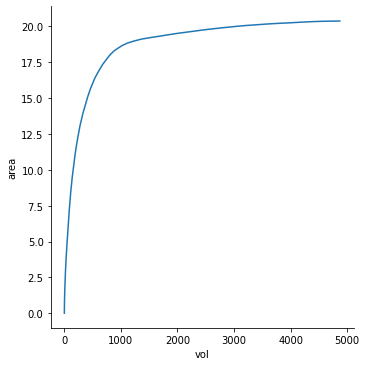

In [ ]:
from scipy.optimize import leastsq
from scipy import interpolate
import pylab as pl
import seaborn as sns
# Area [km^2] vol[GL] elevation[m]
df = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_lower.csv')
#print('maximum of the accumulate Q = {} GL'.format(max(accum_Q)))
#print('len of the accumulate Q = {}'.format(len(accum_Q[:len(df['area'])])))
#print('len of the area data = {}'.format(len(df['area'].values)))
# least squares method
#pl.figure(figsize=(12,9))
#ax=pl.plot()
#pl.plot(df['vol'], df['area'].values,label='vol vs area')

sns.relplot(x="vol", 
            y="area", 
            kind="line",
            data=df)

vol_to_elev = interpolate.interp1d(df['vol'].values,df['elevation'].values, kind='cubic',fill_value="extrapolate")
elev_to_area = interpolate.interp1d(df['elevation'], df['area'], kind='cubic',fill_value="extrapolate")

print('86.9 GL volume to height = {} m'.format(vol_to_elev(86.9)-df['elevation'][0])) # sea level
# Area [km^2] vol[GL] elevation[m]

In [ ]:
def PostAnalysis(Q): # input Q [mm]
  data = pd.DataFrame()
  data['Q_perday']=[i*A*(10**-6)*1000 for i in Q] #[GL] catchment area
  #accum_Q = [sum(Q[:y]) for y in range(1, len(Q) + 1)]
  data['Q_accum'] = [sum(data['Q_perday'][:y]) for y in range(1, len(data['Q_perday']) + 1)]#[i*A*(10**-6)*1000 for i in accum_Q] # catchment area
  data['evaporation']= msl.values[:len(Q)] # real evaporation
  data['area'] = 0
  data['area'].loc[0] = elev_to_area(vol_to_elev(data['Q_perday'].loc[0]))
  data['vol_out'] = 0
  data['area'] = 0
  data['rain'] = [i*8.79*(10**-6)*1000 for i in rainfall_res['rain'][:len(Q)]]
  data['Rain_accum'] = [sum(data['rain'][:y]) for y in range(1, len(data['rain']) + 1)]
  data['vol'] = 0
  for i in range(len(data)):
    if i > 0:
      data['vol_out'].loc[i]=data['evaporation'].loc[i]*data['area'].loc[i-1]*1000*(10**-6)
      data['vol'].loc[i] = data['vol'].loc[i-1]-data['vol_out'].loc[i]+data['Q_perday'].loc[i]+data['rain'].loc[i]
      data['area'].loc[i] = elev_to_area(vol_to_elev(data['vol'].loc[i]))

  print(data.isnull().sum())
  #pl.figure(figsize=(12,9))
  #ax=pl.plot()
  #pl.plot(data.index, data['vol'].values,label='Volume after evaporation')
  #pl.plot(data.index, data['Q_accum']+data['Rain_accum'].values,'--',label='Volume before evaporation')
  #plt.title('accumulate volume for reservoirs',fontsize=12)
  #plt.legend()
  #plt.xlabel('date')
  #plt.ylabel('volume')
  #plt.show()

  df = [go.Scatter(
     x = data.index,
     y = data['vol'].values,
     mode = 'lines',
     name = 'Volume after evaporation',
     #line = {'dash':'dot'}
  )]
  layout = go.Layout(title = 'accumulate volume',  
                     xaxis = {'title' : 'Days'},#'tickangle':90},             
                     yaxis = {'title' : 'Volume [GL]'},            
                     template = 'plotly_white',    
                    )
  fig = go.Figure(data = df, layout = layout)
  fig.add_trace(go.Scatter(
      x = data.index,
      y = data['Q_accum']+data['Rain_accum'].values,
      name = 'Volume before evaporation',
  ))

  #fig.write_html("/content/drive/My Drive/CIVL4516/accum.html")
  HTML(fig.to_html())
  fig.show()


  return data
data_normal = PostAnalysis(Q)
data_normal

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,Q_perday,Q_accum,evaporation,area,vol_out,rain,Rain_accum,vol
0,6.017569824e-07,0.000000602,6.716000080,0.000000000,0.000000000,0.074715000,0.074715000,0.000000000
1,4.155029438e-07,0.000001017,7.059999943,0.098863392,0.000000000,0.130092002,0.204807002,0.130092417
2,2.869062270e-07,0.000001304,6.925000191,0.194815698,0.000684629,0.223265997,0.428072998,0.352674072
3,1.981156353e-07,0.000001502,6.464000225,0.286388287,0.001259289,0.254910000,0.682982998,0.606324981
4,1.368076685e-07,0.000001639,6.776999950,0.309961683,0.001940853,0.065046001,0.748028999,0.669430265
...,...,...,...,...,...,...,...,...
14604,6.117241741e-31,1779.213783409,4.476562500,18.882686256,0.084529596,0.073822266,490.406667266,1149.219269622
14605,4.226597860e-31,1779.213783409,2.843750000,18.883160431,0.053697639,0.372682266,490.779349531,1149.538254248
14606,2.183737286e-01,1779.432157138,4.335937500,18.884441737,0.081876203,0.727784531,491.507134062,1150.402536305
14607,1.627466346e-01,1779.594903772,5.546875000,18.884613266,0.104749638,0.058027734,491.565161797,1150.518561036


In [ ]:
# normal climate condition
Q_to_day = interpolate.interp1d(data_normal['vol'],data_normal.index,fill_value="extrapolate")
print('it needs %.f days to fill without extra water source'%np.round(Q_to_day(86.9)))

it needs 398 days to fill without extra water source


# Upper reservoir

In [ ]:
# rain_day_upper: rainfall of upper catchment
# qtot_upper: total runoff of upper catchent
# etot_upper: evapotransporation of upper catchment (for AWBM)
# msl_reservoir_upper: evaporation of upper reservoir
# rain_day_reservoir_upper: rainfall of upper reservoir

rain_day_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/rain_day_upper.csv') # catchment data
qtot_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/qtot_upper.csv') # catchment data
etot_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/etot_upper.csv') # catchment data

msl_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/msl_reservoir_upper.csv') # reservoir data
rainfall_res_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/rain_day_reservoir_upper.csv') # reservoir data

rainfall_upper = process_date(rain_day_upper).set_index('time')
q_total_upper = process_date(qtot_upper).set_index('time')
e_total_upper = process_date(etot_upper).set_index('time')
msl_upper = process_date(msl_upper).set_index('time')
rainfall_res_upper = process_date(rainfall_res_upper).set_index('time')

rainfall_upper, q_total_upper, e_total_upper, msl_upper, rainfall_res_upper = data_processing(rainfall_upper, q_total_upper, e_total_upper, msl_upper, rainfall_res_upper)

print(rainfall_upper.isnull().any())
print(q_total_upper.isnull().any())
print(e_total_upper.isnull().any())
print(msl_upper.isnull().any())
print(rainfall_res_upper.isnull().any())

rain    False
dtype: bool
qtot    False
dtype: bool
etot    False
dtype: bool
msl    False
dtype: bool
rain    False
dtype: bool


In [ ]:
#========== model parameters ================
A_upper = float(11.73);       # Catchment area [k^2]
A1_upper = float(0.134)       # [0-1]
A2_upper = float(0.433)       # [0-1]
A3_upper = 1- A1 - A2       # [0-1]
C1_upper = float(7)         # [mm]
C2_upper = float(70)       # [mm]
C3_upper = float(150)       # [mm]  
BFI_upper = float(0.13)      # Base flow index [0-1] 0.35
Kbase_upper = float(0.813)   # Baseflow recession constant [0-1] 0.95
Ksurf_upper = float(0.35)    # Surface flow recession constant [0-1]

# Setting initial storage capacities
S1_0_upper = float(0)        # Initial storage capacity storage 1 [mm]
S2_0_upper = float(0)      # Initial storage capacity storage 2 [mm]
S3_0_upper = float(0)     # Initial storage capacity storage 3 [mm]
BS_0_upper = float(0)     # Initial storage capacity baseflow store [mm]
SS_0_upper = float(0)     # Initial storage capacity surface flow store [mm]

# Parameters needed to be calibrate
parameters_upper = [A1_upper,A2_upper,A3_upper,C1_upper,
             C2_upper,C3_upper,BFI_upper,Kbase_upper,Ksurf_upper,
             S1_0_upper,S2_0_upper,S3_0_upper,BS_0_upper,SS_0_upper]


# Reading data
Date_upper = rainfall_upper[:].index
E_upper = e_total_upper[:].values
P_upper = rainfall_upper[:].values
observed_upper = q_total_upper[:].values
observed_upper = [i for k in observed_upper for i in k] 

In [ ]:
%%time
def calibrate_upper(parameters):
    predcted=AWBM(parameters, P_upper, E_upper)
    R2 = r2_score(predcted, observed_upper)
    RMSE = mean_absolute_error(predcted, observed_upper)
    return 1-R2
res_upper = minimize(calibrate_upper, parameters_upper ,method = 'SLSQP', bounds = bnbs, options = {'maxiter':400})
np.set_printoptions(suppress=True)
print('Parameters = {}'.format(res_upper.x))
print('R2 = %.4f'%(1-res_upper.fun))

Parameters = [  0.           0.22989823   1.           7.00108446  70.00302985
 150.00818241   0.17797339   0.68479041   0.69082967   0.00000031
   0.00001036   0.00011976   0.00002303   0.00001937]
R2 = 0.9585
CPU times: user 2min 40s, sys: 1.17 s, total: 2min 41s
Wall time: 2min 41s


In [ ]:
Q_upper = AWBM(res_upper.x, P_upper, E_upper)

data = [go.Scatter(
    x = Date_upper,
    y = Q_upper,
    #mode = 'lines',
    name = 'Predicted',
    #line = {'dash':'dot'}
)]
layout = go.Layout(title = 'AWBM for upper catchment',  
                   xaxis = {'title' : 'Date','tickangle':90},             
                   yaxis = {'title' : 'Runoff [mm^3]'},            
                   template = 'plotly_white',    
                  )
fig = go.Figure(data = data, layout = layout)
fig.add_trace(go.Scatter(
    x = Date_upper,
    y = observed_upper,
    name = 'Real',
))
fig.update_layout(
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type='date',
        
    )
)
fig.write_html("/content/drive/My Drive/CIVL4516/AWBM_upper.html")
HTML(fig.to_html())

In [ ]:
#df_final = df+df_upper
#pl.figure(figsize=(12,9))
#ax=pl.plot()
#pl.plot(df_final['vol'], df_final['area'].values)
#plt.title('function of volume VS area',fontsize=12)
#plt.xlabel('volume')
#plt.ylabel('area')
#plt.show()

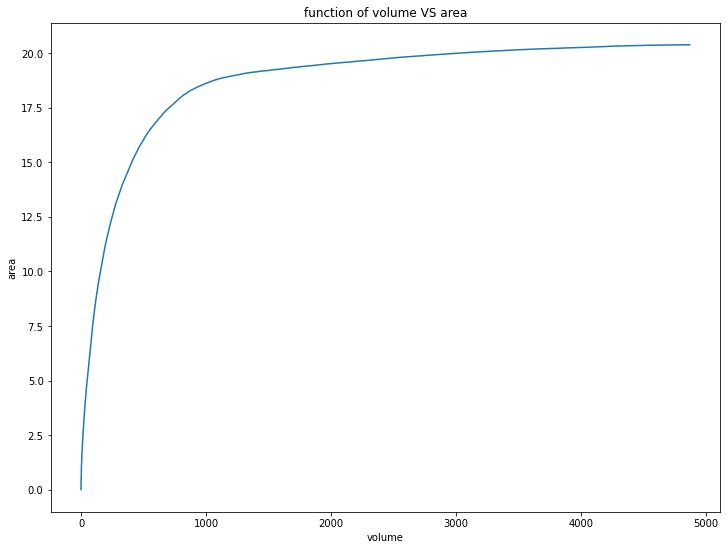

86.9 GL volume to height = 55.55168693437349 m


In [ ]:
# Area [km^2] vol[GL] elevation[m]
df_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_upper.csv')
#print('maximum of the accumulate Q = {} GL'.format(max(accum_Q)))
#print('len of the accumulate Q = {}'.format(len(accum_Q[:len(df['area'])])))
#print('len of the area data = {}'.format(len(df['area'].values)))
# least squares method

#pl.plot(df['vol'].values,df['elevation'].values,'ro')
#pl.plot(df['vol'], df['area'].values)
pl.figure(figsize=(12,9))
ax=pl.plot()
pl.plot(df['vol'], df['area'].values)
plt.title('function of volume VS area',fontsize=12)
plt.xlabel('volume')
plt.ylabel('area')
plt.show()


vol_to_elev_upper = interpolate.interp1d(df_upper['vol'].values,df_upper['elevation'].values, kind='cubic',fill_value="extrapolate")
elev_to_area_upper = interpolate.interp1d(df_upper['elevation'], df_upper['area'], kind='cubic',fill_value="extrapolate")

print('86.9 GL volume to height = {} m'.format(vol_to_elev_upper(86.9)-df_upper['elevation'][0])) # sea level
# Area [km^2] vol[GL] elevation[m]

In [ ]:
%%time
def PostAnalysis_upper(Q): # input Q [mm]
  data = pd.DataFrame()
  data['Q_perday']=[i*A_upper*(10**-6)*1000 for i in Q] # [GL] 
  #accum_Q = [sum(Q[:y]) for y in range(1, len(Q) + 1)]
  data['Q_accum'] = [sum(data['Q_perday'][:y]) for y in range(1, len(data['Q_perday']) + 1)]#[i*A*(10**-6)*1000 for i in accum_Q] # catchment area
  data['evaporation']= msl_upper.values[:len(Q)] # real evaporation
  data['area'] = 0
  data['area'].loc[0] = elev_to_area_upper(vol_to_elev_upper(data['Q_perday'].loc[0]))
  data['vol_out'] = 0
  data['area'] = 0
  data['rain'] = [i*6.12*(10**-6)*1000 for i in rainfall_res_upper['rain'][:len(Q)]] # reservoir area upper 6.12
  data['Rain_accum'] = [sum(data['rain'][:y]) for y in range(1, len(data['rain']) + 1)]
  data['vol'] = 0
  for i in range(len(data)):
    if i > 0:
      data['vol_out'].loc[i]=data['evaporation'].loc[i]*data['area'].loc[i-1]*1000*(10**-6)
      data['vol'].loc[i] = data['vol'].loc[i-1]-data['vol_out'].loc[i]+data['Q_perday'].loc[i]+data['rain'].loc[i]
      data['area'].loc[i] = elev_to_area_upper(vol_to_elev_upper(data['vol'].loc[i]))

  print(data.isnull().sum())
  #pl.figure(figsize=(12,9))
  #ax=pl.plot()
  #pl.plot(data.index, data['vol'].values,label='Volume after evaporation')
  #pl.plot(data.index, data['Q_accum']+data['Rain_accum'].values,'--',label='Volume before evaporation')
  #plt.title('accumulate volume for reservoirs',fontsize=12)
  #plt.legend()
  #plt.xlabel('date')
  #plt.ylabel('volume')
  #plt.show()
  df = [go.Scatter(
     x = data.index,
     y = data['vol'].values,
     mode = 'lines',
     name = 'Volume after evaporation',
     #line = {'dash':'dot'}
  )]
  layout = go.Layout(title = 'accumulate volume',  
                     xaxis = {'title' : 'Days'},#'tickangle':90},             
                     yaxis = {'title' : 'Volume [GL]'},            
                     template = 'plotly_white',    
                    )
  fig = go.Figure(data = df, layout = layout)
  fig.add_trace(go.Scatter(
      x = data.index,
      y = data['Q_accum']+data['Rain_accum'].values,
      name = 'Volume before evaporation',
  ))

  #fig.write_html("/content/drive/My Drive/CIVL4516/accum.html")
  HTML(fig.to_html())
  fig.show()

  return data


data_normal_upper = PostAnalysis_upper(Q_upper)
data_normal_upper

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


CPU times: user 25.6 s, sys: 24.7 ms, total: 25.7 s
Wall time: 25.7 s


In [ ]:
# normal climate condition
Q_to_day_upper = interpolate.interp1d(data_normal_upper['vol'],data_normal_upper.index,fill_value="extrapolate")
print('it needs %.f days to fill without extra water source'%np.round(Q_to_day_upper(86.9)))

it needs 1509 days to fill without extra water source


# merge

In [ ]:
merged = (data_normal + data_normal_upper)
Q_to_day_merged = interpolate.interp1d(merged['vol'],merged.index,fill_value="extrapolate")
#pl.figure(figsize=(12,9))
#ax=pl.plot()
#pl.plot(merged.index, merged['vol'].values,label='Volume after evaporation')
#pl.plot(merged.index, merged['Q_accum']+merged['Rain_accum'].values,'--',label='Volume before evaporation')
#plt.title('accumulate volume (sum of both reservoir)',fontsize=12)
#plt.legend()
#plt.xlabel('date')
#plt.ylabel('volume')
#plt.text(0.5, 2000, 'it needs %.f days to fill 86.9GL without extra water source'%np.round(Q_to_day_merged(86.9)))
#plt.show()
print('it needs %.f days to fill without extra water source'%np.round(Q_to_day_merged(86.9)))



data = [go.Scatter(
    x = merged.index,
    y = merged['vol'].values,
    mode = 'lines',
    name = 'Volume after evaporation',
    #line = {'dash':'dot'}
)]
layout = go.Layout(title = 'accumulate volume (sum of both reservoir)',  
                   xaxis = {'title' : 'Days'},#'tickangle':90},             
                   yaxis = {'title' : 'Volume [GL]'},            
                   template = 'plotly_white',    
                  )
fig = go.Figure(data = data, layout = layout)
fig.add_trace(go.Scatter(
    x = merged.index,
    y = merged['Q_accum']+merged['Rain_accum'].values,
    name = 'Volume before evaporation',
))

fig.write_html("/content/drive/My Drive/CIVL4516/accum.html")
HTML(fig.to_html())

it needs 359 days to fill without extra water source


# Climate change Data generation

In [ ]:
# https://www.climatechangeinaustralia.gov.au/en/climate-projections/climate-analogues/analogues-explorer/
# https://www-sciencedirect-com.ezproxy.library.uq.edu.au/science/article/pii/S0022169412008827?via%3Dihub

#time needed to fill the reservoir to 86.9 GL with 0.3m perday
time_lower = int(round((vol_to_elev(86.9)-df['elevation'][0])/0.3))
time_upper = int(round((vol_to_elev_upper(86.9)-df_upper['elevation'][0])/0.3))

print('the time needed to fill the lower reservoir to 86.9GL with 0.3m perday is {} days'.format(time_lower))
print('the time needed to fill the upper reservoir to 86.9GL with 0.3m perday is {} days'.format(time_upper))


# resample yearly data and get remove nan
yearly_rainfall_data = rainfall_res.resample('Y').sum()[rainfall_res.resample('Y').sum()!=0].dropna()
monthly_rainfall_data = rainfall_res.resample('M').sum()[rainfall_res.resample('M').sum()!=0].dropna()
###
yearly_rainfall_data_upper = rainfall_res_upper.resample('Y').sum()[rainfall_res_upper.resample('Y').sum()!=0].dropna()
monthly_rainfall_data_upper = rainfall_res_upper.resample('M').sum()[rainfall_res_upper.resample('M').sum()!=0].dropna()

# wet year: most heavily rainfall year
rainfall_wet_year = yearly_rainfall_data.where(yearly_rainfall_data==yearly_rainfall_data.max()).dropna()
print('the wettest year is {}, rainfall is {}'.format(rainfall_wet_year.index[0], rainfall_wet_year.values))
rainfall_wet_year = rainfall_res['{}'.format(int(str(rainfall_wet_year.index[0])[:4]))]

wet_year = rainfall_wet_year.copy()
wet_year['evaporation'] = msl['{}'.format(int(str(rainfall_wet_year.index[0])[:4]))]
###
rainfall_wet_year_upper = yearly_rainfall_data_upper.where(yearly_rainfall_data==yearly_rainfall_data.max()).dropna()
rainfall_wet_year_upper = rainfall_res_upper['{}'.format(int(str(rainfall_wet_year_upper.index[0])[:4]))]
wet_year_upper = rainfall_wet_year_upper.copy()
wet_year_upper['evaporation'] = msl_upper['{}'.format(int(str(rainfall_wet_year.index[0])[:4]))]

# drought year
rainfall_dry_year = yearly_rainfall_data.where(yearly_rainfall_data==yearly_rainfall_data.min()).dropna()
print('the drought year is {}, rainfall is {}'.format(rainfall_dry_year.index[0], rainfall_dry_year.values))
rainfall_dry_year = rainfall_res['{}'.format(int(str(rainfall_dry_year.index[0])[:4]))]

dry_year = rainfall_dry_year.copy()
dry_year['evaporation'] = msl['{}'.format(int(str(rainfall_dry_year.index[0])[:4]))]
###
rainfall_dry_year_upper = yearly_rainfall_data_upper.where(yearly_rainfall_data==yearly_rainfall_data.min()).dropna()
rainfall_dry_year_upper = rainfall_res_upper['{}'.format(int(str(rainfall_dry_year_upper.index[0])[:4]))]
dry_year_upper = rainfall_dry_year_upper.copy()
dry_year_upper['evaporation'] = msl_upper['{}'.format(int(str(rainfall_dry_year.index[0])[:4]))]

# normal year (average)
#rainfall_normal_year = pd.DataFrame()
#rainfall_normal_year['rain'] = np.tile(rainfall_res.resample('Y').mean().mean(),365)
#print('normal year just assume as average which is {}'.format(rainfall_res.resample('Y').mean().mean()))

#normal_year = rainfall_normal_year.copy()
#normal_year['evaporation'] = np.tile(msl.resample('Y').mean().mean(),365)


# dry year
rainfall_dry_real_year = yearly_rainfall_data['2019']
print('the dry year is {}, rainfall is {}'.format(rainfall_dry_real_year.index[0], rainfall_dry_real_year.values))
rainfall_dry_real_year = rainfall_res['2019']
dry_real_year = rainfall_dry_real_year.copy()
dry_real_year['evaporation'] = msl['2019']

rainfall_dry_real_year_upper = rainfall_res_upper['2019']
dry_real_year_upper = rainfall_dry_real_year_upper.copy()
dry_real_year_upper['evaporation'] = msl_upper['2019']




merged_wet_year = wet_year+wet_year_upper
merged_drought_year = dry_year+dry_year_upper
merged_dry_year = dry_real_year_upper+dry_real_year

the time needed to fill the lower reservoir to 86.9GL with 0.3m perday is 109 days
the time needed to fill the upper reservoir to 86.9GL with 0.3m perday is 185 days
the wettest year is 2010-12-31 00:00:00, rainfall is [[2904.3359375]]
the drought year is 1982-12-31 00:00:00, rainfall is [[680.30000239]]
the dry year is 2019-12-31 00:00:00, rainfall is [[1771.453125]]


In [ ]:
# median of the yearly data
temp = yearly_rainfall_data.median()
temp2 = yearly_rainfall_data['rain'].apply(lambda x: abs(x-temp))
temp3 = yearly_rainfall_data.where(temp2==temp2.min()).dropna()
normal_year = rainfall_res['{}'.format(int(str(temp3.index[0])[:4]))]
normal_year['evaporation'] = msl['{}'.format(int(str(temp3.index[0])[:4]))]
#[yearly_rainfall_data==yearly_rainfall_data.median()]

###
normal_year_upper = rainfall_res_upper['{}'.format(int(str(temp3.index[0])[:4]))]
normal_year_upper['evaporation'] = msl_upper['{}'.format(int(str(temp3.index[0])[:4]))]

merged_normal_year = normal_year+normal_year_upper

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Testing climate change data

In [ ]:
#print(lower_time)
#print(upper_time)
print('Dry Year')
print(merged_dry_year.describe())
print('-----------------')
print('Wet Year')
print(merged_wet_year.describe())
print('-----------------')
print('Normal Year')
print(merged_normal_year.describe())
print('Drought Year')
print(merged_drought_year.describe())

Dry Year
                rain    evaporation
count  365.000000000  365.000000000
mean    10.385017123    9.285637842
std     37.203302954    3.846969569
min      0.000000000    0.289062500
25%      0.000000000    6.101562500
50%      0.101562500    8.882812500
75%      3.500000000   12.500000000
max    362.000000000   17.390625000
-----------------
Wet Year
                rain    evaporation
count  365.000000000  365.000000000
mean    17.379473459    8.212928082
std     40.189482490    3.256528778
min      0.000000000    1.351562500
25%      0.000000000    5.765625000
50%      1.101562500    7.734375000
75%     14.406250000   10.656250000
max    311.000000000   16.250000000
-----------------
Normal Year
                rain    evaporation
count  365.000000000  365.000000000
mean     8.270119863    9.912243151
std     28.858971528    3.954048205
min      0.000000000    0.312500000
25%      0.000000000    6.562500000
50%      0.203125000    9.742187500
75%      3.398437500   13.18750000

In [ ]:
P_dry_lower = dry_year['rain']
E_dry_lower = dry_year['evaporation']
Q_dry_lower = AWBM(res.x, P_dry_lower, E_dry_lower)
print('total q for dry years is {}'.format(sum(Q_dry_lower)))

P_wet_lower = wet_year['rain']
E_wet_lower = wet_year['evaporation']
Q_wet_lower = AWBM(res.x, P_wet_lower, E_wet_lower)
print('total q for wet years is {}'.format(sum(Q_wet_lower)))

P_normal_lower = normal_year['rain']
E_normal_lower = normal_year['evaporation']
Q_normal_lower = AWBM(res.x, P_normal_lower, E_normal_lower)
print('total q for normal years is {}'.format(sum(Q_normal_lower)))
###
P_dry_upper = dry_real_year_upper['rain']
E_dry_upper = dry_real_year_upper['evaporation']
Q_dry_upper = AWBM(res.x, P_dry_upper, E_dry_upper)
print('total q for dry years is {}'.format(sum(Q_dry_upper)))

P_wet_upper = wet_year_upper['rain']
E_wet_upper = wet_year_upper['evaporation']
Q_wet_upper = AWBM(res.x, P_wet_upper, E_wet_upper)
print('total q for wet years is {}'.format(sum(Q_wet_upper)))

P_normal_upper = normal_year_upper['rain']
E_normal_upper = normal_year_upper['evaporation']
Q_normal_upper = AWBM(res.x, P_normal_upper, E_normal_upper)
print('total q for normal years is {}'.format(sum(Q_normal_upper)))

P_drought_upper = dry_year_upper['rain']
E_drought_upper = dry_year_upper['evaporation']
Q_drought_upper = AWBM(res.x, P_drought_upper, E_drought_upper)
print('total q for normal years is {}'.format(sum(Q_normal_upper)))

P_drought_lower = dry_year['rain']
E_drought_lower = dry_year['evaporation']
Q_drought_lower = AWBM(res.x, P_drought_lower, E_drought_lower)
print('total q for normal years is {}'.format(sum(Q_normal_upper)))

total q for dry years is 7.181483404561441
total q for wet years is 1495.3277668430435
total q for normal years is 460.33919450053793
total q for dry years is 917.3815273909074
total q for wet years is 1849.8533950949093
total q for normal years is 639.6613604973253
total q for normal years is 639.6613604973253
total q for normal years is 639.6613604973253


## Merged climate change data

In [ ]:
normal_NWWCC_year_lower = pd.DataFrame()
normal_NWWCC_year_lower['rain'] = normal_year['rain'].apply(lambda x: x*0.7)
normal_NWWCC_year_lower['evaporation'] = normal_year['evaporation'].apply(lambda x: x*1.08)
###
normal_NWWCC_year_upper = pd.DataFrame()
normal_NWWCC_year_upper['rain'] = normal_year_upper['rain'].apply(lambda x: x*0.7)
normal_NWWCC_year_upper['evaporation'] = normal_year_upper['evaporation'].apply(lambda x: x*1.08)

#normal_NWWCC_year = normal_NWWCC_year_upper + normal_NWWCC_year_lower

P_normal_NWWCC_lower = normal_NWWCC_year_lower['rain']
E_normal_NWWCC_lower = normal_NWWCC_year_lower['evaporation']
Q_normal_NWWCC_lower = AWBM(res.x, P_normal_NWWCC_lower, E_normal_NWWCC_lower)
#print('total q for normal years lower reservoir is {}'.format(sum(Q_normal_NWWCC_lower)))

###
P_normal_NWWCC_upper = normal_NWWCC_year_upper['rain']
E_normal_NWWCC_upper = normal_NWWCC_year_upper['evaporation']
Q_normal_NWWCC_upper = AWBM(res.x, P_normal_NWWCC_upper, E_normal_NWWCC_upper)
#print('total q for normal years upper reservoir is {}'.format(sum(Q_normal_NWWCC_upper)))



normal_NWECC_year_lower = pd.DataFrame()
normal_NWECC_year_lower['rain'] = normal_year['rain'].apply(lambda x: x*0.89)
normal_NWECC_year_lower['evaporation'] = normal_year['evaporation'].apply(lambda x: x*1.08)
###
normal_NWECC_year_upper = pd.DataFrame()
normal_NWECC_year_upper['rain'] = normal_year_upper['rain'].apply(lambda x: x*0.89)
normal_NWECC_year_upper['evaporation'] = normal_year_upper['evaporation'].apply(lambda x: x*1.08)

#normal_NWWCC_year = normal_NWWCC_year_upper + normal_NWWCC_year_lower

P_normal_NWECC_lower = normal_NWECC_year_lower['rain']
E_normal_NWECC_lower = normal_NWECC_year_lower['evaporation']
Q_normal_NWECC_lower = AWBM(res.x, P_normal_NWECC_lower, E_normal_NWECC_lower)
#print('total q for normal years lower reservoir is {}'.format(sum(Q_normal_NWECC_lower)))

###
P_normal_NWECC_upper = normal_NWECC_year_upper['rain']
E_normal_NWECC_upper = normal_NWECC_year_upper['evaporation']
Q_normal_NWECC_upper = AWBM(res.x, P_normal_NWECC_upper, E_normal_NWECC_upper)
#print('total q for normal years upper reservoir is {}'.format(sum(Q_normal_NWECC_upper)))


merged_dry_Q = pd.Series(Q_dry_lower[:])+pd.Series(Q_dry_upper[:])
merged_drought_Q = pd.Series(Q_drought_lower[:])+pd.Series(Q_drought_upper[:])
merged_wet_Q = pd.Series(Q_wet_lower[:])+pd.Series(Q_wet_upper[:])
merged_normal_Q = pd.Series(Q_normal_lower[:])+pd.Series(Q_normal_upper[:])
merged_normal_NWWCC_Q = pd.Series(Q_normal_NWWCC_upper[:])+pd.Series(Q_normal_NWWCC_lower[:])
merged_normal_NWECC_Q = pd.Series(Q_normal_NWECC_upper[:])+pd.Series(Q_normal_NWECC_lower[:])
print('total q for dry years in both reservoir is {}'.format(sum(merged_dry_Q)))
print('total q for drought years in both reservoir is {}'.format(sum(merged_drought_Q)))
print('total q for normal years in both reservoir is {}'.format(sum(merged_normal_Q)))
print('total q for NWWCC years in both reservoir is {}'.format(sum(merged_normal_NWWCC_Q)))
print('total q for NWECC years in both reservoir is {}'.format(sum(merged_normal_NWECC_Q)))

total q for dry years in both reservoir is 924.5630107954693
total q for drought years in both reservoir is 121.50686557388009
total q for normal years in both reservoir is 1100.0005549978616
total q for NWWCC years in both reservoir is 497.5227724569207
total q for NWECC years in both reservoir is 849.9385988309818


# merged reseroir analysis

In [ ]:
df_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_upper.csv')
df = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_lower.csv')
df_final = df+df_upper
Q_to_area_upper = interpolate.interp1d(df_upper['vol'],df_upper['area'],fill_value="extrapolate")
Q_to_area_lower = interpolate.interp1d(df['vol'],df['area'],fill_value="extrapolate")
merged_Q_to_area = interpolate.interp1d(df_final['vol'],df_final['area'],fill_value="extrapolate")
merged_Q_to_day = interpolate.interp1d(df_final['vol'],df_final.index,fill_value="extrapolate")

max_depth_upper = 65 #m
max_depth_lower = 95 #m
max_area_upper = Q_to_area_upper(max_depth_upper)
max_area_lower = Q_to_area_lower(max_depth_lower)

def PostAnalysis_merged(Q,msl,rainfall): # input Q [mm]
  data = pd.DataFrame()
  data['Q_perday']=[i*(A+A_upper)*(10**-6)*1000 for i in Q] # [GL] 
  #accum_Q = [sum(Q[:y]) for y in range(1, len(Q) + 1)]
  data['Q_accum'] = [sum(data['Q_perday'][:y]) for y in range(1, len(data['Q_perday']) + 1)]#[i*A*(10**-6)*1000 for i in accum_Q] # catchment area
  data['evaporation']= msl.values[:len(Q)] # real evaporation
  data['area'] = 0
  data['area'].loc[0] = merged_Q_to_area(data['Q_perday'].loc[0])
  data['vol_out'] = 0
  data['area'] = 0
  data['rain'] = [i*(max_area_upper+max_area_lower)*(10**-6)*1000 for i in rainfall.values[:len(Q)]] # reservoir area upper 6.12
  data['Rain_accum'] = [sum(data['rain'][:y]) for y in range(1, len(data['rain']) + 1)]
  data['vol'] = 0
  for i in range(len(data)):
    if i > 0:
      data['vol_out'].loc[i]=data['evaporation'].loc[i]*data['area'].loc[i-1]*1000*(10**-6)
      data['vol'].loc[i] = data['vol'].loc[i-1]-data['vol_out'].loc[i]+data['Q_perday'].loc[i]+data['rain'].loc[i]
      data['area'].loc[i] = merged_Q_to_area(data['vol'].loc[i])

  print(data.isnull().sum())
  #pl.figure(figsize=(12,9))
  #ax=pl.plot()
  #pl.plot(data.index, data['vol'].values,label='Volume after evaporation')
  #pl.plot(data.index, data['Q_accum']+data['Rain_accum'].values,'--',label='Volume before evaporation')
  #plt.title('accumulate volume for reservoirs',fontsize=12)
  #plt.legend()
  #plt.xlabel('date')
  #plt.ylabel('volume')
  #plt.show()
  df = [go.Scatter(
     x = data.index,
     y = data['vol'].values,
     mode = 'lines',
     name = 'Volume after evaporation',
     #line = {'dash':'dot'}
  )]
  layout = go.Layout(title = 'accumulate volume',  
                     xaxis = {'title' : 'Days'},#'tickangle':90},             
                     yaxis = {'title' : 'Volume [GL]'},            
                     template = 'plotly_white',    
                    )
  fig = go.Figure(data = df, layout = layout)
  fig.add_trace(go.Scatter(
      x = data.index,
      y = data['Q_accum']+data['Rain_accum'].values,
      name = 'Volume before evaporation',
  ))

  #fig.write_html("/content/drive/My Drive/CIVL4516/accum.html")
  HTML(fig.to_html())
  fig.show()

  return data


## drought year

In [ ]:
data_drought = PostAnalysis_merged(merged_drought_Q,merged_drought_year['evaporation'],merged_drought_year['rain'])
Q_drought_to_day = interpolate.interp1d(data_drought['vol'],data_drought.index,fill_value="extrapolate")
print('==========================================================================')
print('the final volume for dry year during required time is {} GL'.format(round(data_drought['vol'].max())))
print('==========================================================================')

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


the final volume for dry year during required time is 22 GL


## Dry Year

In [ ]:
data_dry = PostAnalysis_merged(merged_dry_Q,merged_dry_year['evaporation'],merged_dry_year['rain'])
Q_dry_to_day = interpolate.interp1d(data_dry['vol'],data_dry.index,fill_value="extrapolate")
print('========================================================')
print('it needs {} days to fill the dam to 86.9 GL for wet year'.format(Q_dry_to_day(86.9)))
print('========================================================')

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


it needs 240.365010191546 days to fill the dam to 86.9 GL for wet year


##Wet Year

In [ ]:
data_wet = PostAnalysis_merged(merged_wet_Q,merged_wet_year['evaporation'],merged_wet_year['rain'])
Q_wet_to_day = interpolate.interp1d(data_wet['vol'],data_wet.index,fill_value="extrapolate")
print('=================================================================================')
print('it needs {} days to fill the dam to 86.9 GL for wet year'.format(Q_wet_to_day(86.9)))
print('=================================================================================')

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


it needs 56.91666718910823 days to fill the dam to 86.9 GL for wet year


## Normal year

In [ ]:
data_normal = PostAnalysis_merged(merged_normal_Q,merged_normal_year['evaporation'],merged_normal_year['rain'])
Q_normal_to_day = interpolate.interp1d(data_normal['vol'],data_normal.index,fill_value="extrapolate")
print('=================================================================================')
print('it needs {} days to fill the dam to 86.9 GL for normal year'.format(Q_normal_to_day(86.9)))
print('=================================================================================')

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


it needs 65.13214519760547 days to fill the dam to 86.9 GL for normal year


## Normal year with rainfall-30%, evap+8%
normal years with worse climate change scenario

In [ ]:
data_normal_NWWCC = PostAnalysis_merged(merged_normal_NWWCC_Q,merged_normal_year['evaporation']*0.92,merged_normal_year['rain']*0.7)
Q_normal_NWWCC_to_day = interpolate.interp1d(data_normal_NWWCC['vol'],data_normal_NWWCC.index,fill_value="extrapolate")
print('====================================================================================')
print('the volume for normal year with worse climate change during required time is {} GL'.format(round(data_normal_NWWCC['vol'].max())))
print('====================================================================================')


/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


the volume for normal year with worse climate change during required time is 54 GL


## Normal year with rainflal-11% evap+8%
normal years with expected climate change scenario

In [ ]:
data_normal_NWECC = PostAnalysis_merged(merged_normal_NWECC_Q,merged_normal_year['evaporation']*0.92,merged_normal_year['rain']*0.89)
Q_normal_NWECC_to_day = interpolate.interp1d(data_normal_NWECC['vol'],data_normal_NWECC.index,fill_value="extrapolate")
print('=============================================================================================')
print('it needs {} days to fill the dam to 86.9 GL for normal year with expected climate change'.format(Q_normal_NWECC_to_day(86.9)))
print('=============================================================================================')

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Q_perday       0
Q_accum        0
evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


it needs -7.109187172839455 days to fill the dam to 86.9 GL for normal year with expected climate change


# Check the reservor works on dry years

## Drought year

In [ ]:
df_upper = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_upper.csv')
df = pd.read_csv('/content/drive/My Drive/CIVL4516/Area&Volumn&Elevation_lower.csv')
df_final = df+df_upper
Q_to_area_upper = interpolate.interp1d(df_upper['vol'],df_upper['area'],fill_value="extrapolate")
Q_to_area_lower = interpolate.interp1d(df['vol'],df['area'],fill_value="extrapolate")
merged_Q_to_area = interpolate.interp1d(df_final['vol'],df_final['area'],fill_value="extrapolate")
max_depth_upper = 65 #m
max_depth_lower = 95 #m
max_area_upper = Q_to_area_upper(max_depth_upper)
max_area_lower = Q_to_area_lower(max_depth_lower)

def both_reservoir_combined_check(Q,df): # input Q [mm]
  """
  首先，reservoir内的水初始状态为满水位 (同时考虑两水库)
  查看是否可以度过干旱年
  df为dataframe 第一列为rain 第二列为evaporation
  no runoff
  """
  data = pd.DataFrame()
  #data['Q_perday']=[i*(A_upper+A)*(10**-6)*1000 for i in Q] #[GL] catchment area
  #accum_Q = [sum(Q[:y]) for y in range(1, len(Q) + 1)]
  #data['Q_accum'] = [sum(data['Q_perday'][:y]) for y in range(1, len(data['Q_perday']) + 1)]#[i*A*(10**-6)*1000 for i in accum_Q] # catchment area
  data['evaporation']= df['evaporation'].values[:len(Q)] # real evaporation
  data['area'] = 0 # km2
  #data['area'].loc[0] = merged_Q_to_area(data['Q_perday'].loc[0]) # initial area
  data['vol_out'] = 0
  #data['area'] = 0
  data['rain'] = [i*(max_area_upper+max_area_lower)*(10**-6)*1000 for i in df['rain'][:len(Q)]] # reservoir area upper 6.12 lower 8.79
  data['Rain_accum'] = [sum(data['rain'][:y]) for y in range(1, len(data['rain']) + 1)]
  data['vol'] = 86.9 # 初始满水位
  data['area'].loc[0] = merged_Q_to_area(data['vol'].loc[0]) # initial area
  for i in range(len(data)):
    if i > 0:
      data['vol_out'].loc[i]=data['evaporation'].loc[i]*data['area'].loc[i-1]*1000*(10**-6)
      data['vol'].loc[i] = data['vol'].loc[i-1]-data['vol_out'].loc[i]+data['rain'].loc[i]
      data['area'].loc[i] = merged_Q_to_area(data['vol'].loc[i])
      #data['area'].loc[i] = elev_to_area(vol_to_elev()) + elev_to_area_upper(vol_to_elev_upper()) 

  print(data.isnull().sum())
 
  df = [go.Scatter(
     x = data.index,
     y = data['vol'].values,
     mode = 'lines',
     name = 'Volume after evaporation',
                
     #line = {'dash':'dot'}
  )]
  layout = go.Layout(title = 'accumulate volume',  
                     xaxis = {'title' : 'Days'},#'tickangle':90},             
                     yaxis = {'title' : 'Volume [GL]'},            
                     template = 'plotly_white',    
                    )
  
  fig = go.Figure(data = df, layout = layout)
  

  #fig.write_html("/content/drive/My Drive/CIVL4516/accum.html")
  HTML(fig.to_html())
  fig.show()

  return data


#dry year de 
test = merged_drought_year.copy()
test['rain'] = test['rain']
drought_Q_whole_year = pd.Series(Q_drought_lower[:])+pd.Series(Q_drought_upper[:])

temp = both_reservoir_combined_check(drought_Q_whole_year,merged_drought_year)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


In [ ]:
# 1997-2009 drought period
merged_rainfall = pd.DataFrame(rainfall_res_upper+rainfall_res)['1997':'2009']
merged_evaporation = pd.DataFrame(msl_upper + msl)['1997':'2009']

merged_Q = pd.DataFrame(AWBM(res_upper.x, rainfall_res_upper['1997':'2009'].values, msl_upper['1997':'2009'].values))+pd.DataFrame(AWBM(res.x, rainfall_res['1997':'2009'].values, msl['1997':'2009'].values))

temp = merged_rainfall.join(merged_evaporation)
temp.columns = ['rain','evaporation']

temp2 = both_reservoir_combined_check(merged_Q.values,temp)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


In [ ]:
frames = []
i = 0
while i < 24:
  frames.append(merged_drought_year)
  i+=1

repeated_drought_msl_rain = pd.concat(frames)

#repeated_dry_msl_rain = pd.DataFrame(np.repeat(merged_dry_year.values,10,axis=0))
#repeated_dry_msl_rain.columns = merged_dry_year.columns

repeated_drought_Q = pd.DataFrame(AWBM(res_upper.x, repeated_drought_msl_rain['rain'].values, repeated_drought_msl_rain['evaporation'].values))

test = repeated_drought_msl_rain.copy()
test['rain'] = test['rain']
test['evaporation'] = test['evaporation']

temp2 = both_reservoir_combined_check(repeated_drought_Q,test)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


## Wet Year

In [ ]:
merged_Q = pd.DataFrame(AWBM(res_upper.x, rainfall_res_upper['{}'.format(int(str(merged_wet_year.index[0])[:4]))].values, msl_upper['{}'.format(int(str(merged_wet_year.index[0])[:4]))].values))+pd.DataFrame(AWBM(res.x, rainfall_res['{}'.format(int(str(merged_wet_year.index[0])[:4]))].values, msl['{}'.format(int(str(merged_wet_year.index[0])[:4]))].values))

both_reservoir_combined_check(merged_Q.values,merged_wet_year)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,evaporation,area,vol_out,rain,Rain_accum,vol
0,6.2812500,7.604626342,0.000000000,0.081985384,0.081985384,86.900000000
1,10.1796875,7.621195613,0.077412720,0.349078393,0.431063777,87.171665673
2,12.4062500,7.617571877,0.094550458,0.035136593,0.466200370,87.112251808
3,12.6406250,7.613696891,0.096290870,0.032757553,0.498957923,87.048718492
4,8.7265625,7.613361355,0.066441402,0.060940029,0.559897952,87.043217119
...,...,...,...,...,...,...
360,2.7812500,10.139706552,0.028100803,0.755436752,71.740779553,132.478015606
361,7.3750000,10.189693021,0.074780336,1.083378288,72.824157841,133.486613558
362,10.7343750,10.194956214,0.109379986,0.215577639,73.039735480,133.592811211
363,12.3750000,10.242627439,0.126162583,1.088044867,74.127780347,134.554693495


## dry year

In [ ]:
merged_Q = pd.DataFrame(AWBM(res_upper.x, rainfall_res_upper['{}'.format(int(str(merged_dry_year.index[0])[:4]))].values, msl_upper['{}'.format(int(str(merged_dry_year.index[0])[:4]))].values))+pd.DataFrame(AWBM(res.x, rainfall_res['{}'.format(int(str(merged_dry_year.index[0])[:4]))].values, msl['{}'.format(int(str(merged_dry_year.index[0])[:4]))].values))

both_reservoir_combined_check(merged_Q.values,merged_dry_year)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,evaporation,area,vol_out,rain,Rain_accum,vol
0,11.5000000,7.604626342,0.000000000,0.000000000,0.000000000,86.900000000
1,11.4062500,7.599626133,0.086740269,0.004758080,0.004758080,86.818017811
2,15.1718750,7.592593788,0.115300578,0.000000000,0.004758080,86.702717233
3,14.7109375,7.588995949,0.111694173,0.052704890,0.057462970,86.643727950
4,13.5546875,7.585434251,0.102866469,0.044469751,0.101932721,86.585331233
...,...,...,...,...,...,...
360,8.4218750,8.325467078,0.070048948,0.203773940,41.029384115,98.790742985
361,5.2031250,8.383727624,0.043318446,1.021248740,42.050632855,99.768673278
362,8.8828125,8.497561022,0.074471081,1.985217512,44.035850367,101.679419710
363,10.0703125,8.502160726,0.085573095,0.162781248,44.198631615,101.756627863


## normal year

In [ ]:
merged_Q = pd.DataFrame(AWBM(res_upper.x, rainfall_res_upper['{}'.format(int(str(merged_normal_year.index[0])[:4]))].values, msl_upper['{}'.format(int(str(merged_normal_year.index[0])[:4]))].values))+pd.DataFrame(AWBM(res.x, rainfall_res['{}'.format(int(str(merged_normal_year.index[0])[:4]))].values, msl['{}'.format(int(str(merged_normal_year.index[0])[:4]))].values))

both_reservoir_combined_check(merged_Q.values,merged_normal_year)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,evaporation,area,vol_out,rain,Rain_accum,vol
0,9.7578125,7.604626342,0.000000000,0.354934492,0.354934492,86.900000000
1,16.7109375,7.605877370,0.127080436,0.147591991,0.502526483,86.920511556
2,17.1796875,7.598052932,0.130666596,0.002379040,0.504905523,86.792224000
3,12.8125000,7.592333067,0.097350053,0.003568560,0.508474084,86.698442507
4,13.1953125,7.586512954,0.100183207,0.004758080,0.513232164,86.603017380
...,...,...,...,...,...,...
360,16.7343750,7.959116289,0.133326057,0.000000000,35.353177295,92.730353961
361,17.0156250,7.950908450,0.135429338,0.000000000,35.353177295,92.594924623
362,17.7812500,7.942340141,0.141377091,0.000000000,35.353177295,92.453547532
363,17.8828125,7.933804271,0.142031380,0.001189520,35.354366815,92.312705672


## normal year with worse climate chenge

In [ ]:
# rainfall - 30% evap +8%
temp = pd.DataFrame()
temp['rain'] = merged_normal_year['rain']*0.7
temp['evaporation'] = merged_normal_year['evaporation']*1.08

both_reservoir_combined_check(merged_Q.values,temp)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,evaporation,area,vol_out,rain,Rain_accum,vol
0,10.5384375,7.604626342,0.000000000,0.248454144,0.248454144,86.900000000
1,18.0478125,7.602556752,0.137246870,0.103314394,0.351768538,86.866067524
2,18.5540625,7.594054978,0.141058313,0.001665328,0.353433866,86.726674539
3,13.8375000,7.587798191,0.105082736,0.002497992,0.355931858,86.624089795
4,14.2509375,7.581406134,0.108133238,0.003330656,0.359262515,86.519287214
...,...,...,...,...,...,...
360,18.0731250,7.291328374,0.131915027,0.000000000,24.747224107,81.734603010
361,18.3768750,7.283576020,0.133991830,0.000000000,24.747224107,81.600611180
362,19.2037500,7.275483458,0.139871973,0.000000000,24.747224107,81.460739207
363,19.3134375,7.267401892,0.140514595,0.000832664,24.748056771,81.321057276


## normal year with expected climate change

In [ ]:
# rainfall -11% evap +8%
temp = pd.DataFrame()
temp['rain'] = merged_normal_year['rain']*0.89
temp['evaporation'] = merged_normal_year['evaporation']*1.08

both_reservoir_combined_check(merged_Q.values,temp)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



evaporation    0
area           0
vol_out        0
rain           0
Rain_accum     0
vol            0
dtype: int64


,evaporation,area,vol_out,rain,Rain_accum,vol
0,10.5384375,7.604626342,0.000000000,0.315891698,0.315891698,86.900000000
1,18.0478125,7.604267102,0.137246870,0.131356872,0.447248570,86.894110002
2,18.5540625,7.595790962,0.141090047,0.002117346,0.449365916,86.755137301
3,13.8375000,7.589574063,0.105106757,0.003176019,0.452541934,86.653206562
4,14.2509375,7.583235601,0.108158546,0.004234691,0.456776626,86.549282708
...,...,...,...,...,...,...
360,18.0731250,7.633619985,0.138115614,0.000000000,31.464327793,87.375372619
361,18.3768750,7.625063984,0.140282080,0.000000000,31.464327793,87.235090539
362,19.2037500,7.616133024,0.146429822,0.000000000,31.464327793,87.088660717
363,19.3134375,7.607226142,0.147093709,0.001058673,31.465386466,86.942625680
